# Импорт данных и необходимых пакетов для работы

In [1]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
data = pd.read_excel('Book1.xls')

In [3]:
data.head()

,"Wavelenhgt, nm","Absorbance, dry Nafion_no acid","Absorbance, new lot_from China",Unnamed: 3,Unnamed: 4,Unnamed: 5
0,190,1.756962,1.259637,1.227738,0.529224,0.031899
1,191,1.375506,1.306425,1.177376,0.198130,0.129049
2,192,1.418965,1.218165,1.129570,0.289395,0.088595
3,193,1.413822,1.221169,1.084166,0.329656,0.137003
4,194,1.406061,1.217715,1.041020,0.365041,0.176695


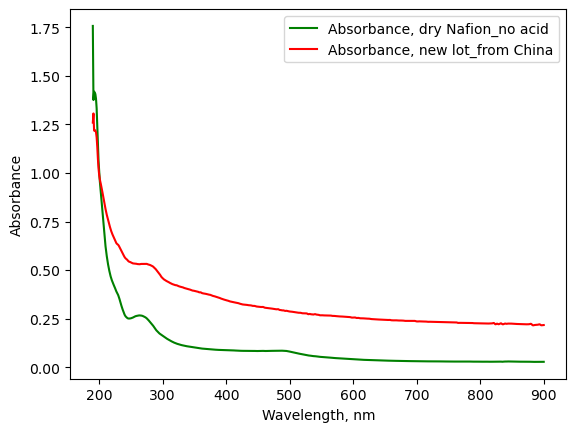

In [4]:
plt.plot(data['Wavelenhgt, nm'], data['Absorbance, dry Nafion_no acid'], label='Absorbance, dry Nafion_no acid', color='green')
plt.plot(data['Wavelenhgt, nm'], data['Absorbance, new lot_from China'], label='Absorbance, new lot_from China', color='red')
plt.xlabel('Wavelength, nm')
plt.ylabel('Absorbance')
plt.legend()
plt.show()

In [8]:
def Rayleigh_background(data):
    massive_p = np.arange(1, 10)
    wv = data['Wavelenhgt, nm']
    usa = data['Absorbance, dry Nafion_no acid']
    china = data['Absorbance, new lot_from China']
    usa_good = []
    for i in range(len(wv)):
        new_usa = 10e8 / (usa[i] - massive_p[k])
        usa_good.append(new_usa)
    china_good = []
    for j in range(len(wv)):
        new_china = 10e8 / (china[i] - 10)
        china_good.append(new_china)
    #return usa_good, china_good   
    plt.plot(wv, usa_good, label='Absorbance, dry Nafion_no acid', color='green')
    plt.plot(wv, china_good, label='Absorbance, new lot_from China', color='red')
    plt.xlabel('Wavelength, nm')
    plt.ylabel('Absorbance')
    plt.legend()
    plt.show()

# Рассматриваем китайский нафион в диапазоне [0, 150] с шагом 1

In [9]:
def Rayleigh_background_china(data, p):
    wv = data['Wavelenhgt, nm']
    china = data['Absorbance, new lot_from China']
    china_good = []
    for j in range(len(wv)):
        new_china = china[j] - 10e8 / (china[j] - p) ** 4
        china_good.append(new_china)
    return china_good 

In [12]:
def plot_pro_china(data):
    wv = data['Wavelenhgt, nm']
    massive_p = np.arange(0, 150)
    Ray_list = []
    for k in range(len(massive_p)):
        Ray = Rayleigh_background_china(data, massive_p[k])
        Ray_list.append(Ray)
        plt.plot(wv, Ray_list[k], label=f'Absorbance, new lot_from China, $\lambda$={np.round(massive_p[k], 2)}')
        plt.xlabel('Wavelength, nm')
        plt.ylabel('Absorbance')
        plt.legend()
        plt.show()

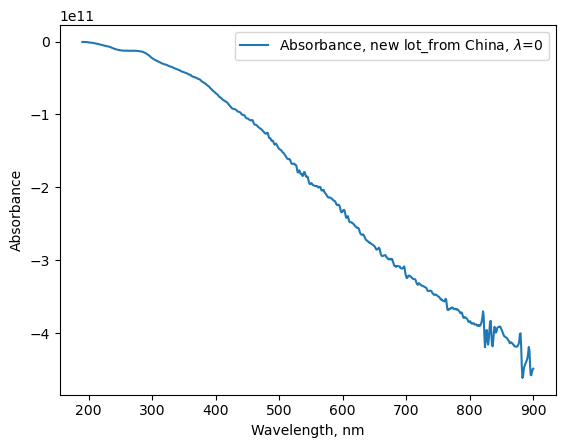

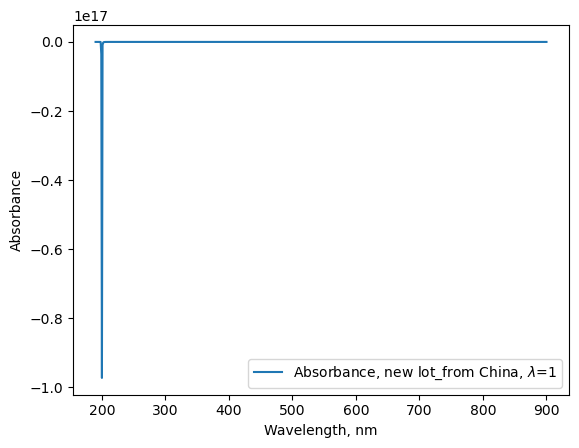

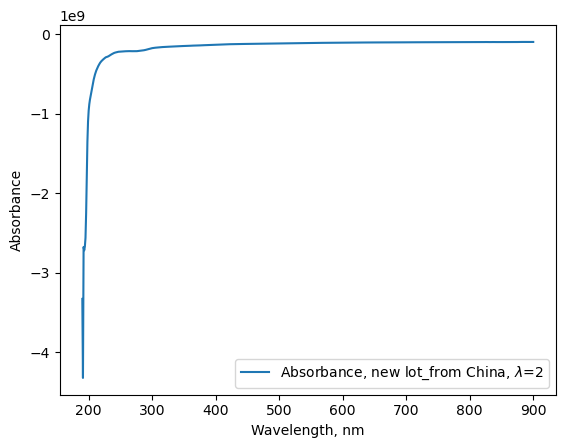

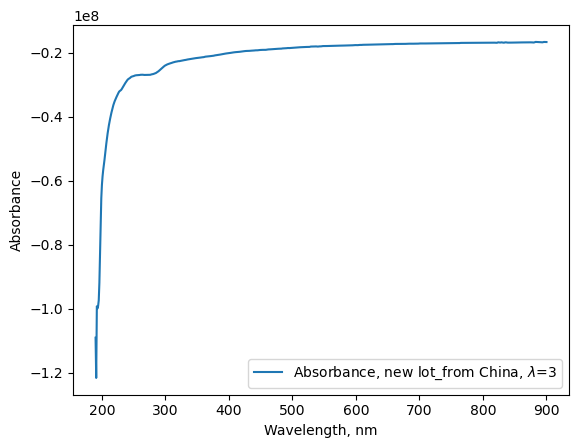

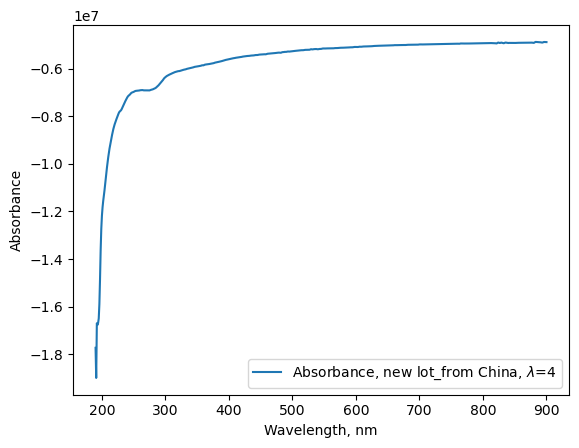

...

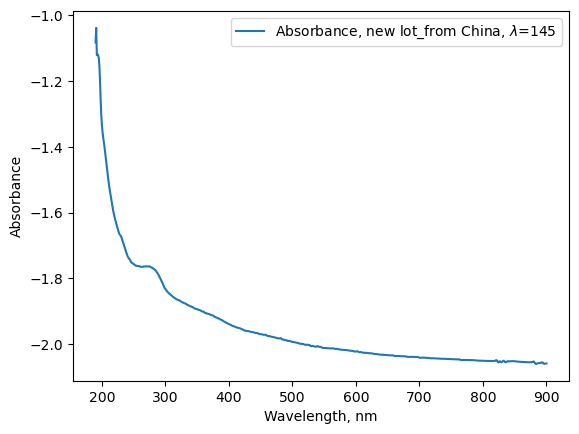

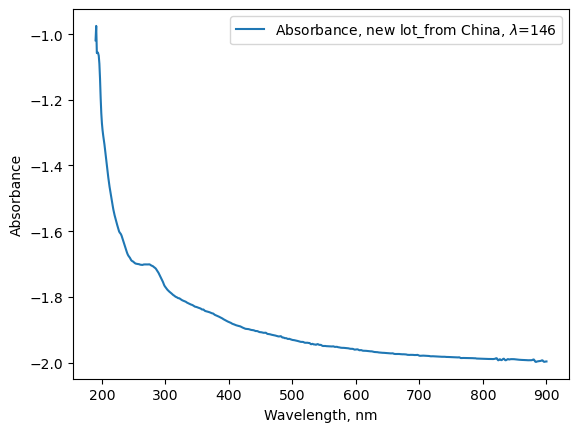

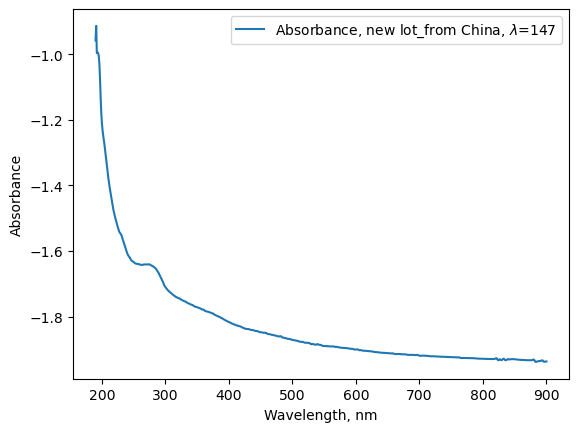

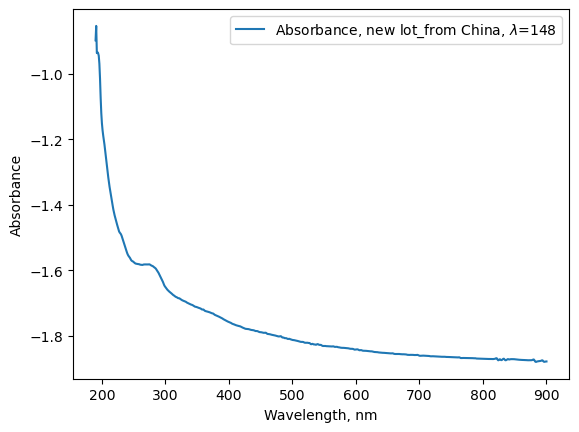

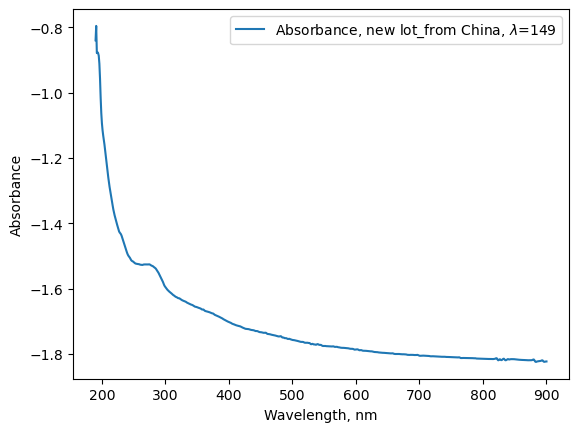

In [13]:
plot_pro_china(data)

Вывод: по графикам интресующий даипазон лежит в интервале [83, 85]

# Рассматриваем китайский нафион в диапазоне [83, 85] с шагом 0.01

In [122]:
def plot_pro_china(data):
    wv = data['Wavelenhgt, nm']
    massive_p = np.arange(83, 85, 0.01)
    Ray_list = []
    for k in range(len(massive_p)):
        Ray = Rayleigh_background_china(data, massive_p[k])
        Ray_list.append(Ray)
        #plt.figure(figsize=(10, 16))
        plt.plot(wv, Ray_list[k], label=f'Absorbance, new lot_from China, $\lambda$={np.round(massive_p[k], 2)}')
        plt.xlabel('Wavelength, nm')
        plt.ylabel('Absorbance')
        plt.legend()
        plt.show()

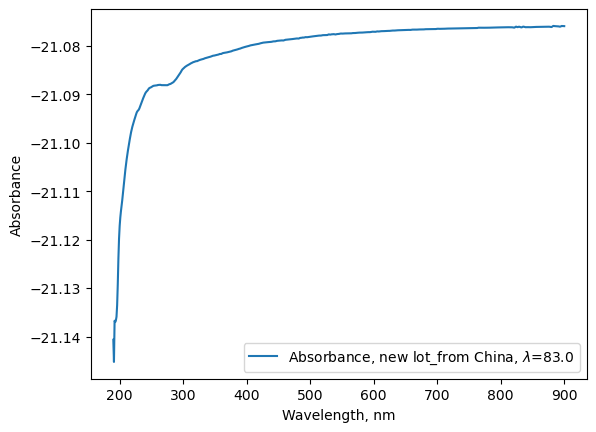

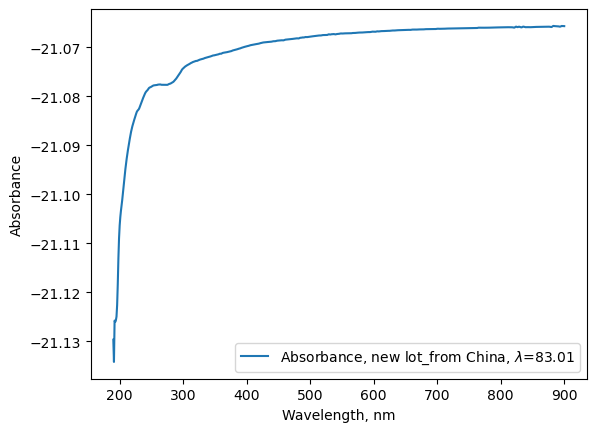

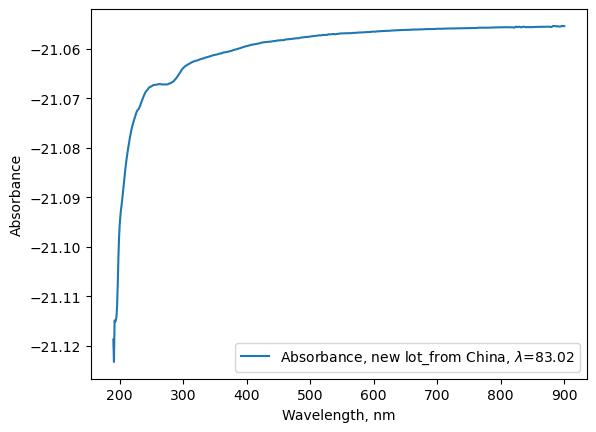

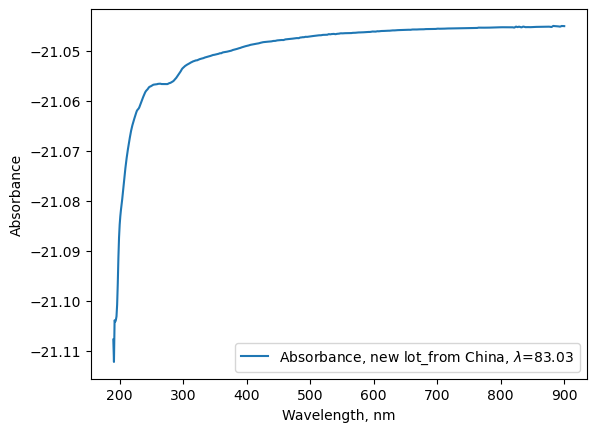

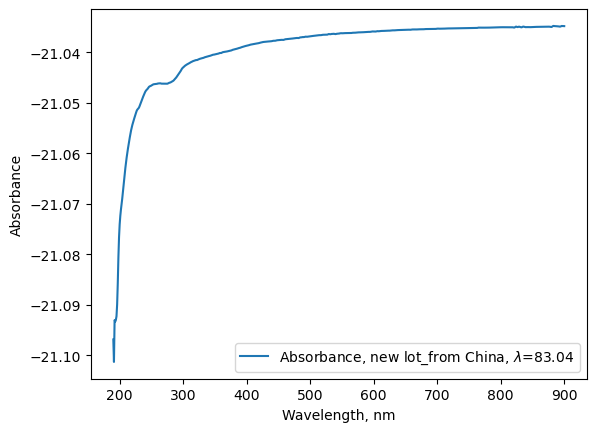

...

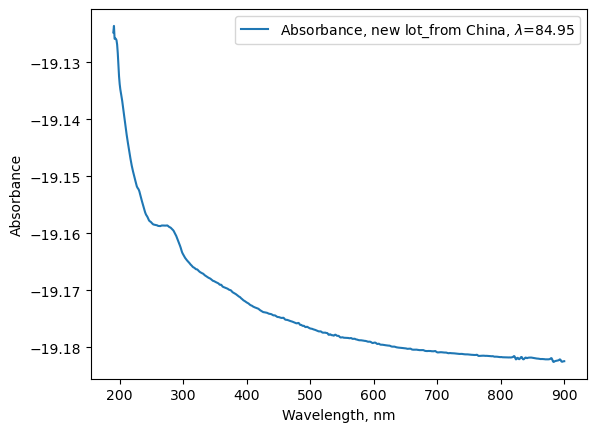

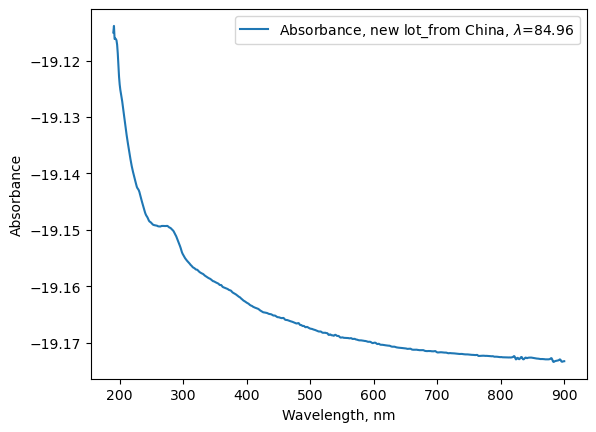

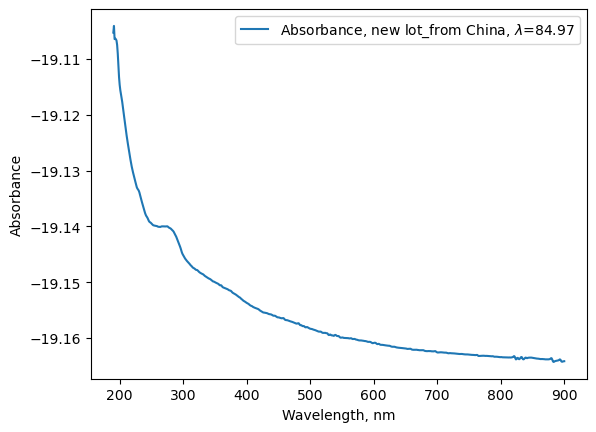

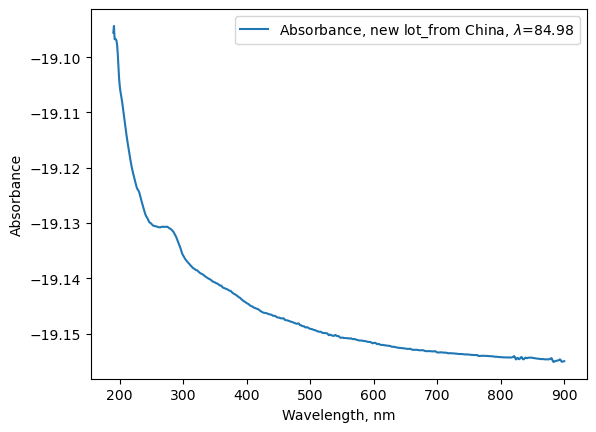

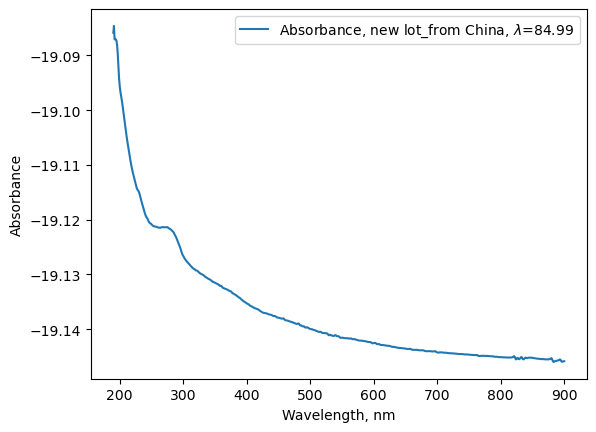

In [123]:
plot_pro_china(data)

In [150]:
def plot_pro_china__all(data):
    wv = data['Wavelenhgt, nm']
    massive_p = np.arange(84, 84.1, 0.01)
    Ray_list = []
    plt.figure(figsize=(12, 8))
    for k in range(len(massive_p)):
        Ray = Rayleigh_background_china(data, massive_p[k])
        Ray_list.append(Ray)
        plt.plot(wv, Ray_list[k], label=f'Absorbance, dry Nafion_no acid, $\lambda$={np.round(massive_p[k], 2)}')
        #plt.plot(wv, china_good, label='Absorbance, new lot_from China', color='red')
    plt.xlabel('Wavelength, nm')
    plt.ylabel('Absorbance')
    
    plt.legend()
    plt.show()

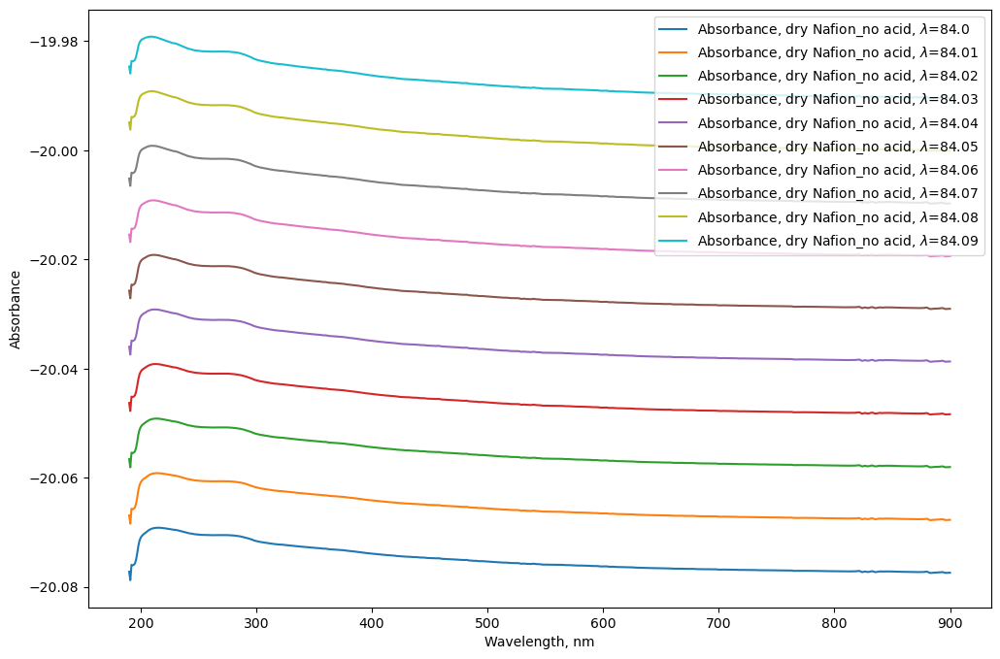

In [151]:
plot_pro_china__all(data)